In [1]:
import re
import qgrid
import warnings
from tqdm.auto import tqdm

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import spearmanr
from statsmodels.tsa.seasonal import MSTL
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import grangercausalitytests, adfuller, ccf

sns.set(style="ticks", palette="muted", color_codes=True)

warnings.filterwarnings("ignore")

plt.rcParams['axes.labelsize'] = 15
plt.rcParams['axes.titlesize'] = 20

seed = 42

In [2]:
def show_tbl(df):
    return qgrid.show_grid(df, show_toolbar=True)

In [3]:
df = pd.read_csv("datasets/aq_weather_static_data_with_caqi_fixed_Rev1.csv", parse_dates=['DATE']).\
        drop("index", axis=1)
# df = pd.read_csv("Merged_df_fixed.csv", parse_dates=['DATE']).drop("index", axis=1)

In [4]:
df.head(3)

,powiat_voivod,DATE,LAT,LON,NO2_24H_AVG_POLLUTION,O3_24H_AVG_POLLUTION,PM10_24H_AVG_POLLUTION,PM25_24H_AVG_POLLUTION,CC,FG,...,"[crop production] sugar beets, area in ha, total","[crop production] rape and turnip rape, area in ha, total","[crop production] permanent meadows, area in ha, total","[crop production] permanent pastures, area in ha, total",NO2_sub_idx,O3_sub_idx,PM10_sub_idx,PM25_sub_idx,CAQI_idx,CAQI_level
0,"powiat aleksandrowski, kujawsko-pomorskie",2017-01-01,52.888422,18.780908,NaN,32.22,24.968064,NaN,4.746750,0.0,...,1184.0,2616.0,2320.0,406.0,NaN,13.425,24.968064,NaN,24.968064,vlow
1,"powiat aleksandrowski, kujawsko-pomorskie",2017-01-02,52.888422,18.780908,NaN,34.62,17.943745,NaN,6.167555,36.8,...,1184.0,2616.0,2320.0,406.0,NaN,14.425,17.943745,NaN,17.943745,vlow
2,"powiat aleksandrowski, kujawsko-pomorskie",2017-01-03,52.888422,18.780908,NaN,42.00,14.477950,NaN,5.198131,0.0,...,1184.0,2616.0,2320.0,406.0,NaN,17.500,14.477950,NaN,17.500000,vlow


In [5]:
df.columns

Index(['powiat_voivod', 'DATE', 'LAT', 'LON', 'NO2_24H_AVG_POLLUTION',
       'O3_24H_AVG_POLLUTION', 'PM10_24H_AVG_POLLUTION',
       'PM25_24H_AVG_POLLUTION', 'CC', 'FG',
       ...
       '[crop production] sugar beets, area in ha, total',
       '[crop production] rape and turnip rape, area in ha, total',
       '[crop production] permanent meadows, area in ha, total',
       '[crop production] permanent pastures, area in ha, total',
       'NO2_sub_idx', 'O3_sub_idx', 'PM10_sub_idx', 'PM25_sub_idx', 'CAQI_idx',
       'CAQI_level'],
      dtype='object', length=145)

In [6]:
#Creating variables to make visualization easier

#Pollutants
pollutant_cols = [
    'NO2_24H_AVG_POLLUTION',  'O3_24H_AVG_POLLUTION',  'PM10_24H_AVG_POLLUTION', 'PM25_24H_AVG_POLLUTION'
]

poll_dict = {col : "PM2.5" if col.startswith("PM25") else col.split("_")[0] for col in pollutant_cols}

#Weather
weather_cols = ['CC', 'FG', 'HU', 'RR', 'SD', 'TG']

weather_dict = {
    'CC' : "Cloud Cover", 
    "FG" : "Wind Speed",
    "HU" : "Humidity",
    "RR" : "Precipitation",
    "SD" : "Snow Depth",
    "TG" : "Temperature"
}

#### Pollutions

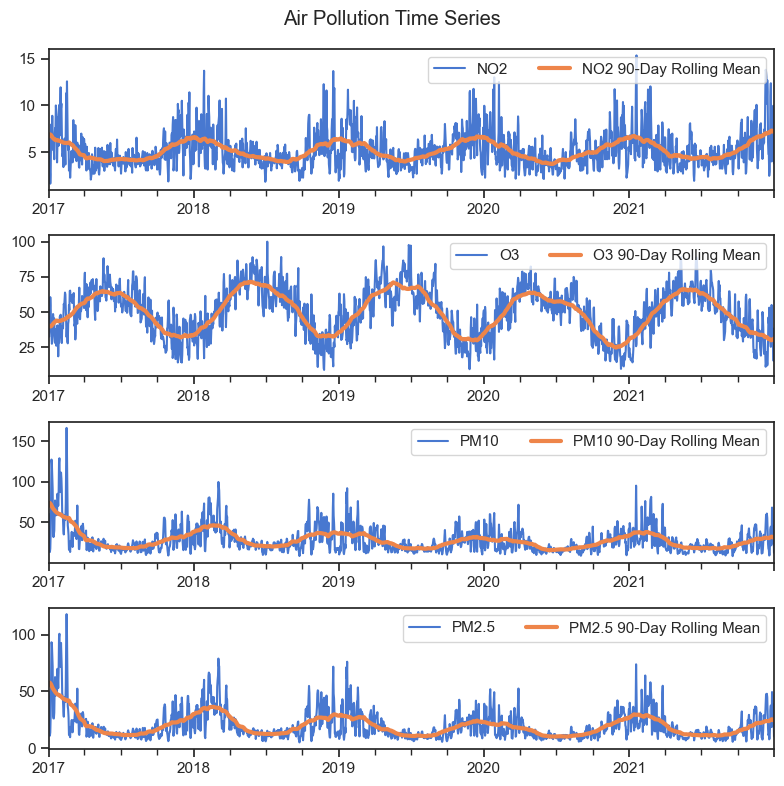

In [7]:
#Daily Time series of Pollutants
fig, axes = plt.subplots(4, 1, figsize=(8, 8), tight_layout=True)

for col, ax in zip(pollutant_cols, axes.flatten()):
    
    df.groupby('DATE')[col].mean().plot(ax=ax, label=poll_dict[col]);
    
    df.groupby('DATE')[col].mean().rolling(90, center=True, min_periods=30).mean().\
        plot(ax=ax, label=f'{poll_dict[col]} 90-Day Rolling Mean', lw=3);
    
    ax.legend(ncol=2, loc="upper right")
    ax.set_xlabel("")
    
plt.suptitle("Air Pollution Time Series");

In [8]:
#Some of the pollutants shows measurements below Zero, which is not possible. 
#Probably this is due to imputations of pollutant datasets. 
#I will replace the zero and negative values with the respective lowest positive value for each pollutant.

# for col in pollutant_cols:
    
#     if df.loc[df[col].le(0), col].isnull().all():
#         pass
#     else:
#         df.loc[df[col].le(0), col] = df.loc[df[col].gt(0), col].min()

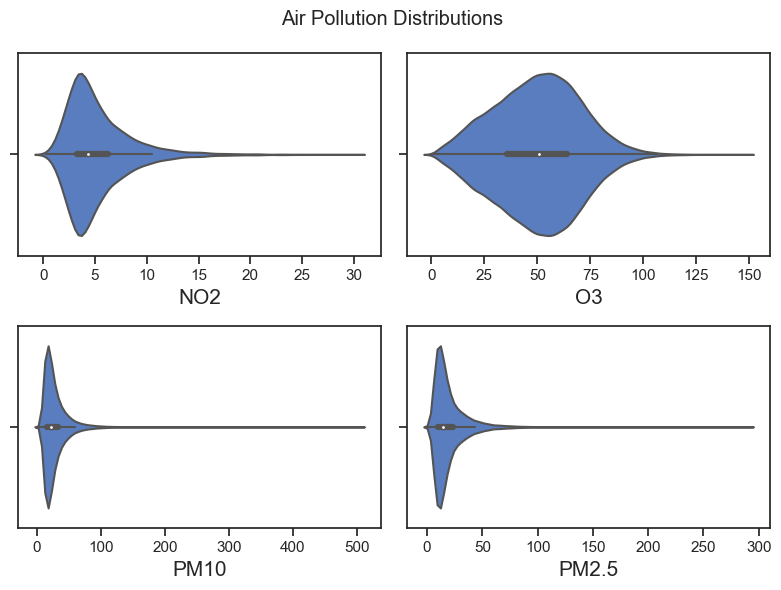

In [9]:
fig, axes = plt.subplots(2, 2, figsize=(8, 6), tight_layout=True)

for col, ax in zip(pollutant_cols, axes.flatten()):
    
    sns.violinplot(df[col], ax=ax);
    ax.set_xlabel(poll_dict[col])
    
plt.suptitle("Air Pollution Distributions");

In [10]:
#Extracting day, month, year and dayofweek features from DATE
df['day'] = df['DATE'].dt.day
df['month'] = df['DATE'].dt.month
df['year'] = df['DATE'].dt.year
df['dayofweek'] = df['DATE'].dt.dayofweek

In [11]:
#Creating new column for seasons
#https://climateknowledgeportal.worldbank.org/country/poland/climate-data-historical
df.loc[df['month'].isin([9, 10, 11]), 'season'] = "Autumn"
df.loc[df['month'].isin([12, 1, 2]), 'season'] = "Winter"
df.loc[df['month'].isin([3, 4, 5]), 'season'] = "Spring"
df.loc[df['month'].isin([6, 7, 8]), 'season'] = "Summer"

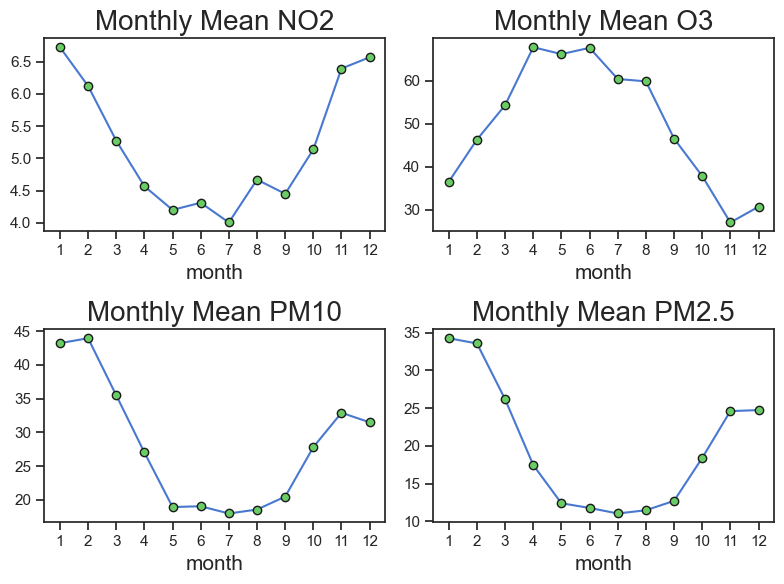

In [12]:
#Checking for monthly seasonality pattern
fig, axes = plt.subplots(2, 2, tight_layout=True, figsize=(8, 6))

for col, ax in zip(pollutant_cols, axes.flatten()):
    
    df.groupby('month')[col].mean().plot(ax=ax, marker="o", mfc="g", mec="k")
    ax.set_xticks(np.arange(1, 13, 1))
    ax.set_title(f'Monthly Mean {poll_dict[col]}');

O3 seems to be highest during summer and lowest during winter. The opposite is true for the other pollutants. Will need to compare with weather data to understand patterns.

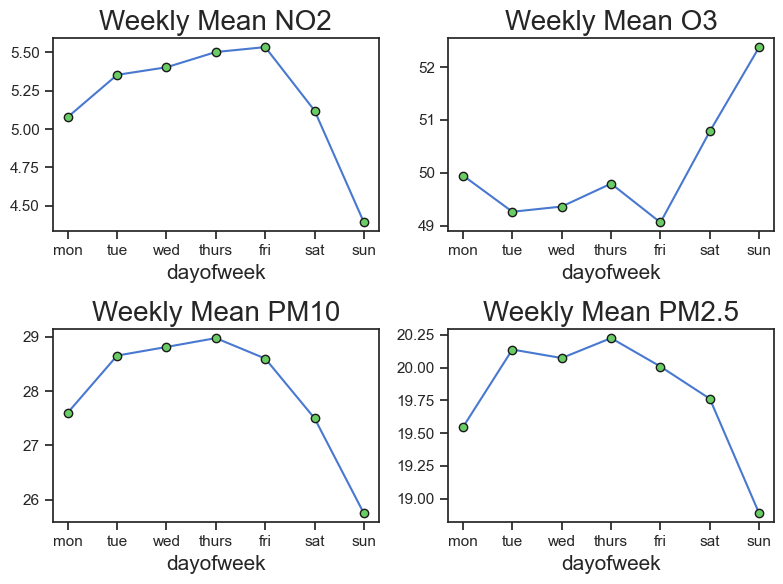

In [13]:
#Checking for weekly seasonality
days=["mon", "tue", "wed", "thurs", "fri", "sat", "sun"]

fig, axes = plt.subplots(2, 2, tight_layout=True, figsize=(8, 6))

for col, ax in zip(pollutant_cols, axes.flatten()):
    
    df.groupby('dayofweek')[col].mean().plot(ax=ax, marker="o", mfc="g", mec="k")
    ax.set_xticks(np.arange(7), days)
    ax.set_title(f'Weekly Mean {poll_dict[col]}');

For O3, measurements are higher during the weekends and lower during working days. Where as the other pollutants shows the opposite patterns. This is an interesting observation. Perhaps, this shows that pollution depends on the number of cars on the roads? Will need to look deeper into this.

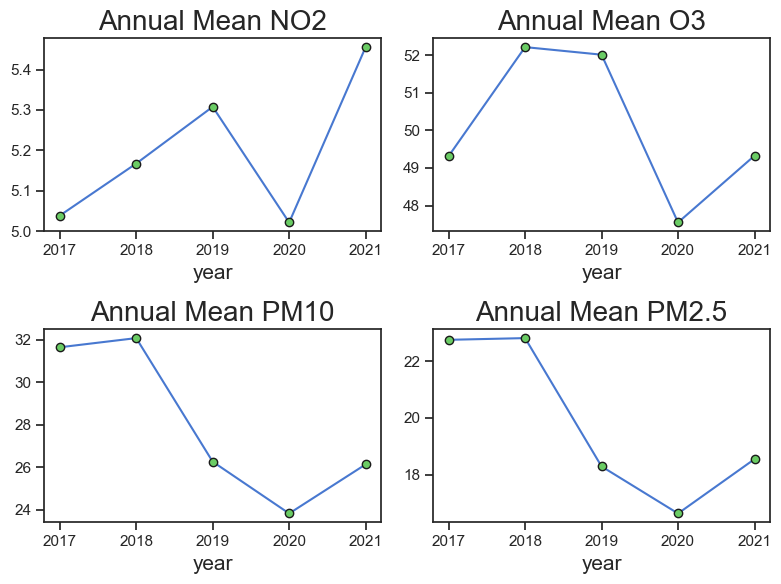

In [14]:
#Yearly Seasonality
fig, axes = plt.subplots(2, 2, tight_layout=True, figsize=(8, 6))

for col, ax in zip(pollutant_cols, axes.flatten()):
    
    df.groupby('year')[col].mean().plot(ax=ax, marker="o", mfc="g", mec="k")
    ax.set_title(f'Annual Mean {poll_dict[col]}');

#### Weather

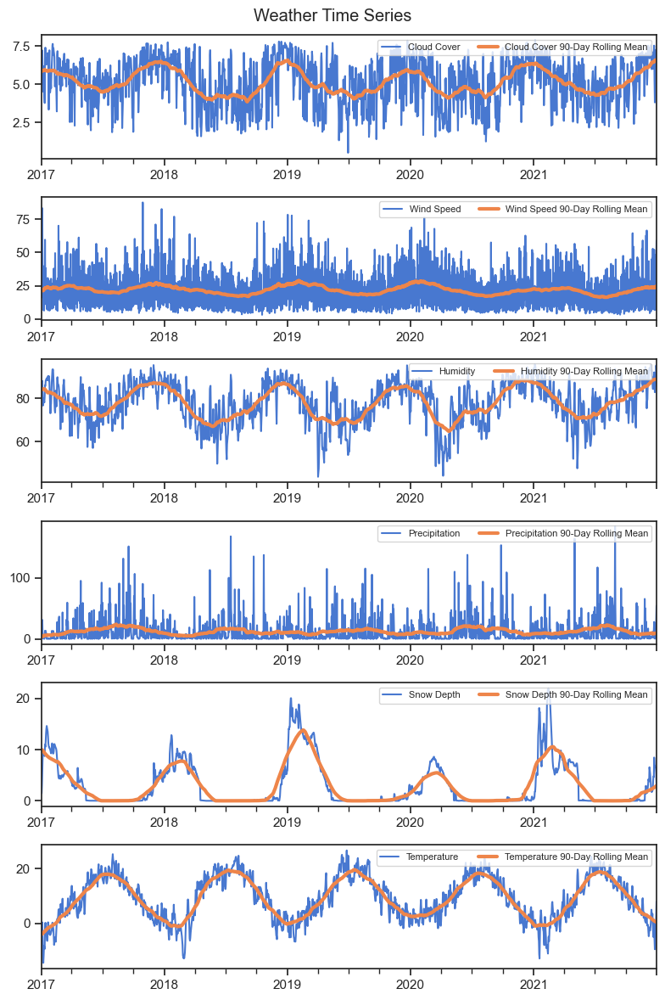

In [15]:
fig, axes = plt.subplots(6, 1, figsize=(8, 12), tight_layout=True)

for col, ax in zip(weather_cols, axes.flatten()):
    
    df.groupby('DATE')[col].mean().plot(ax=ax, label=weather_dict[col]);
    
    df.groupby('DATE')[col].mean().rolling(90, center=True, min_periods=30).mean().\
        plot(ax=ax, label=f'{weather_dict[col]} 90-Day Rolling Mean', lw=3);
    
    ax.legend(ncol=2, loc="upper right", prop={'size': 8})
    ax.set_xlabel("")
    
plt.suptitle("Weather Time Series");

In [16]:
# #Replacing negative values for 'CC' with 0
# df.loc[df['CC'].lt(0), 'CC']

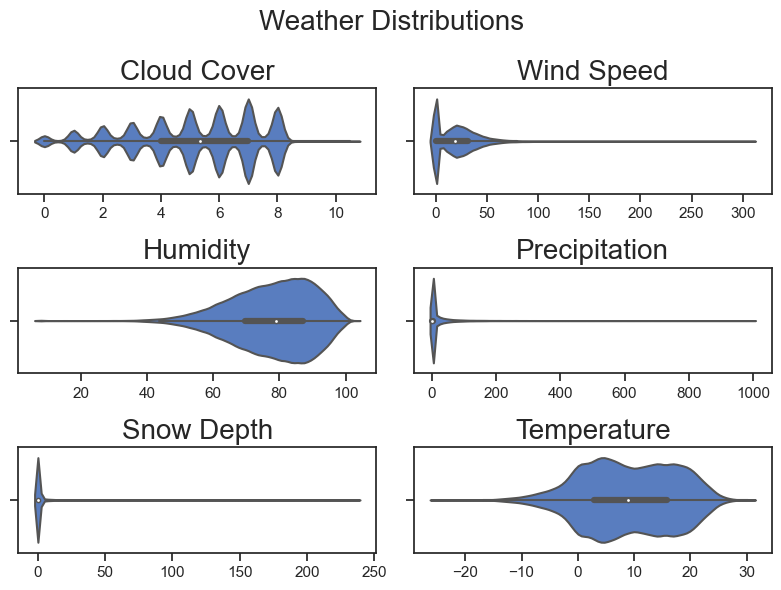

In [17]:
fig, axes = plt.subplots(3, 2, figsize=(8, 6), tight_layout=True)

for col, ax in zip(weather_cols, axes.flatten()):
    
    sns.violinplot(df[col], ax=ax);
    ax.set_title(weather_dict[col])
    ax.set_xlabel("")
    
plt.suptitle("Weather Distributions", fontsize=20);

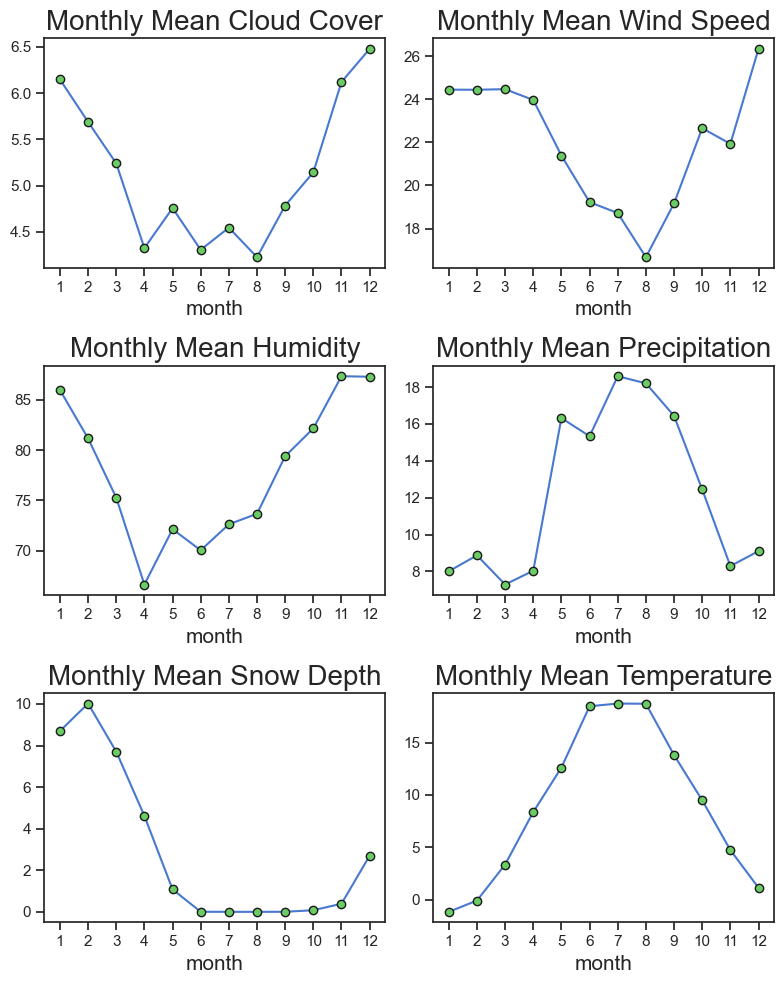

In [18]:
#Checking for monthly seasonality pattern
fig, axes = plt.subplots(3, 2, tight_layout=True, figsize=(8, 10))

for col, ax in zip(weather_cols, axes.flatten()):
    
    df.groupby('month')[col].mean().plot(ax=ax, marker="o", mfc="g", mec="k")
    ax.set_xticks(np.arange(1, 13, 1))
    ax.set_title(f'Monthly Mean {weather_dict[col]}');

* **Cloud Cover**: Cloud Covers are lowest during summers (April to Aug) and highest during winter months (Nov to Feb).


* **Wind Speed & Humidity**: Similar to cloud cover. The lowest mean wind speed is during August whereas the lowest mean humidity is on April.


* **Precipitation (Rail Fall)** is higher during July to Sep. Precipitation is lower during winter months.


* **Snow Depth**: Snow Depth is only observed significantly during the winter months from Dec to April.


* **Mean Temperature**: Temperature is highest during summer months from June to Aug. Temp is lowest during winter months of Dec to Feb.

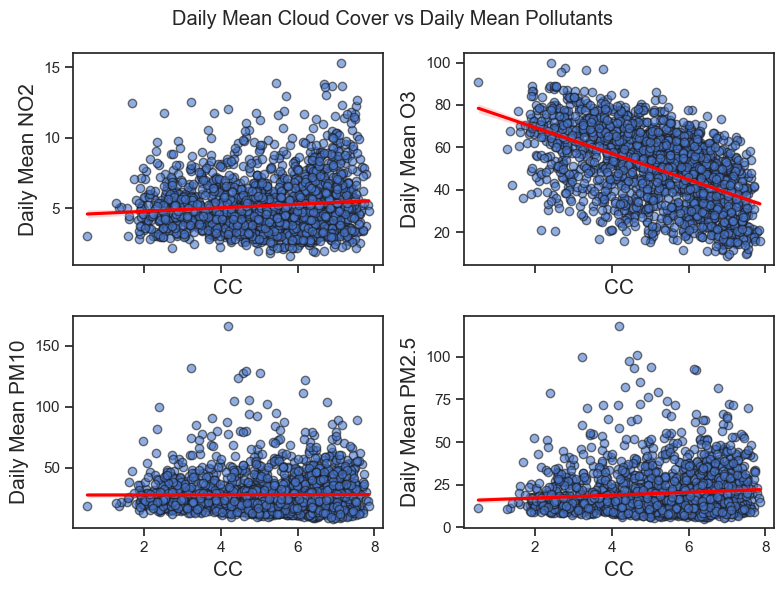

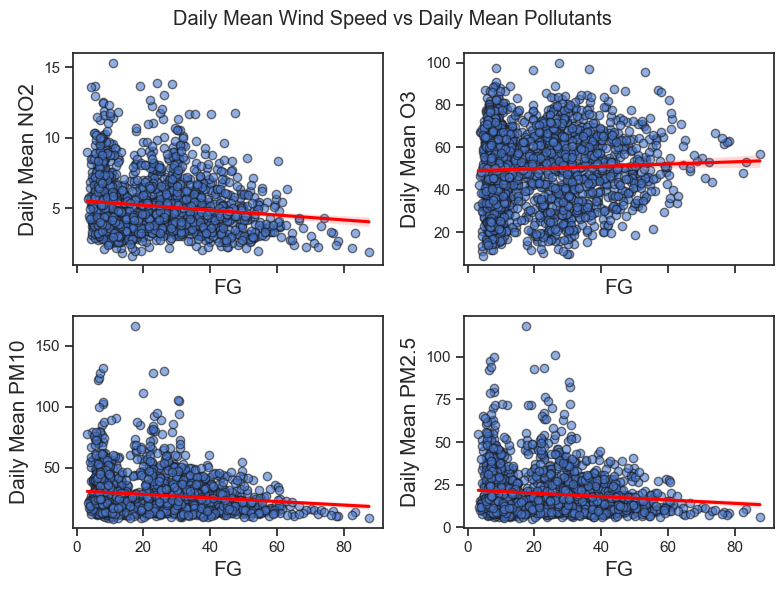

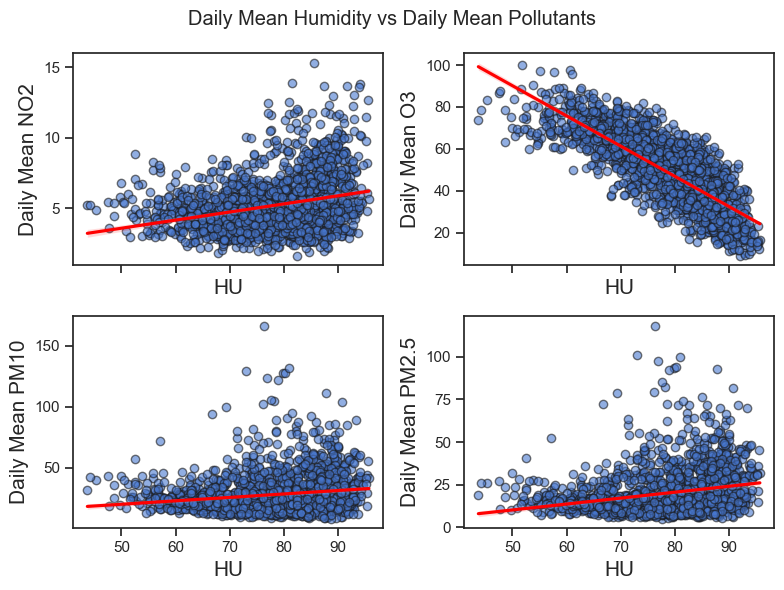

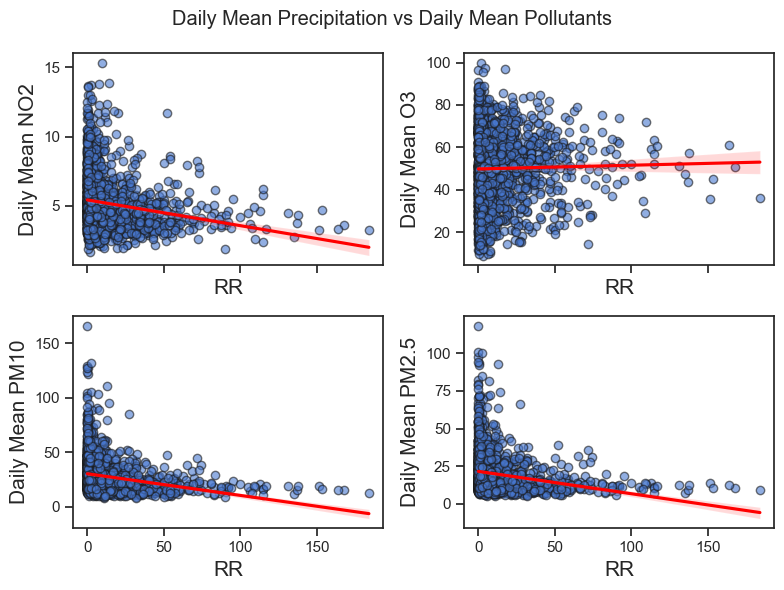

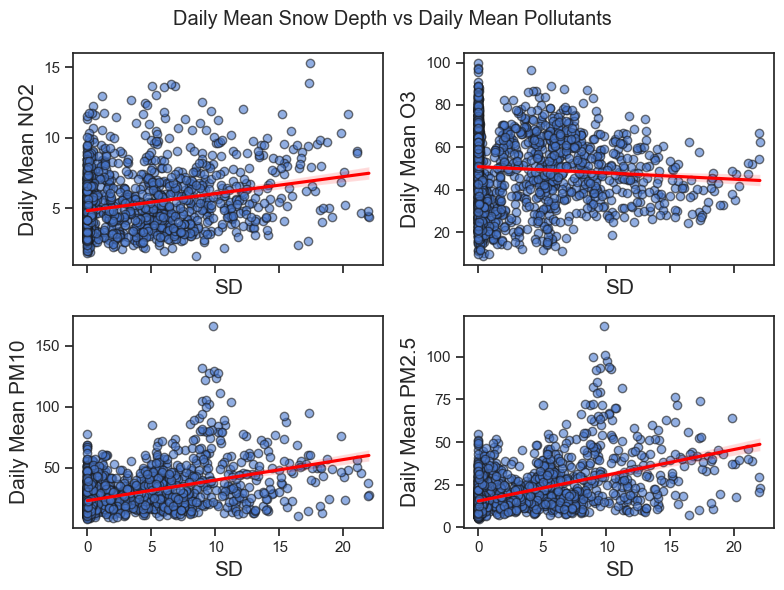

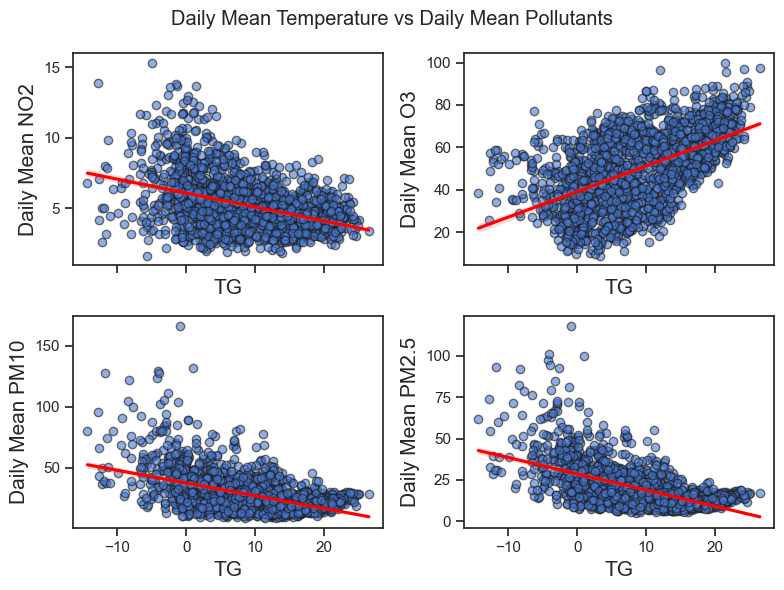

In [19]:
pol_wthr_agg = df.groupby('DATE')[pollutant_cols + weather_cols].mean()

for wthr_col in weather_cols:

    fig, axes = plt.subplots(2, 2, figsize=(8, 6), sharex=True, tight_layout=True)

    for pol_col, ax in zip(pollutant_cols, axes.flatten()):

        sns.regplot(x=wthr_col, y=pol_col, data=pol_wthr_agg, ax=ax, 
                    line_kws={'color' : 'red'}, scatter_kws={'edgecolor' : 'k', 'alpha' : 0.6})

        ax.set_ylabel(f"Daily Mean {poll_dict[pol_col]}");
        plt.suptitle(f"Daily Mean {weather_dict[wthr_col]} vs Daily Mean Pollutants");

Ozone seems to have some linear relation with cloud cover, humidity and temperature. For the rest of the variables, there is no discernible relations between pollution and weather variables = Except for temperature. There do seem to be some form of linear relation between temperature and the 4 pollutants.

In [20]:
#Dropping redundant columns
df = df.drop(["NO2_sub_idx", "O3_sub_idx", "PM10_sub_idx", "PM25_sub_idx"], axis=1)

# CAQI (Common Air Quality Index)

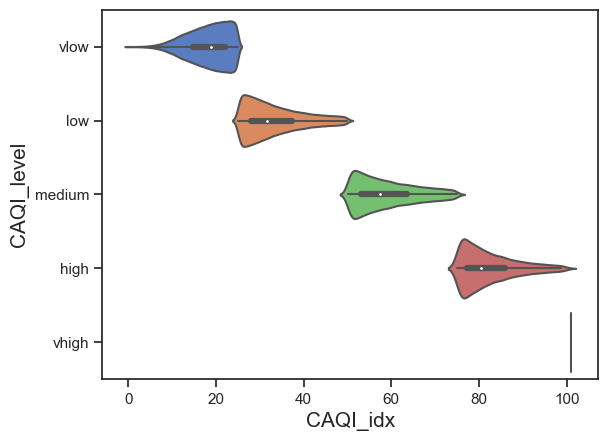

In [21]:
sns.violinplot(x='CAQI_idx', y='CAQI_level', data=df, orient='h');

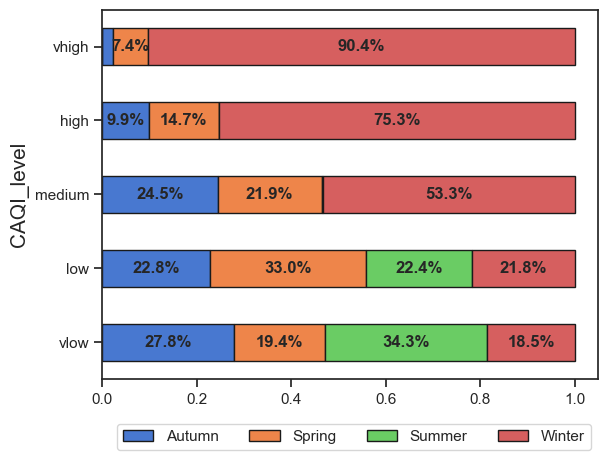

In [22]:
ax = pd.crosstab(columns=df['season'], index=df['CAQI_level'], normalize='index').\
        reindex(["vlow", "low", "medium", "high", "vhigh"]).\
            plot(kind='barh', stacked=True, edgecolor='k');

for c in ax.containers:
    # Filter the labels
    labels = [f'{np.round(v*100, 1)}%' if v > 0.05 else "" for v in c.datavalues]    
    ax.bar_label(c, labels=labels, label_type="center", fontweight = "bold")

ax.legend(ncol=5, bbox_to_anchor=(1, -0.1));

Winter seems to have the highest effect on overall air quality, as the CAQI levels are significantly higher during winter and lower during spring and summer.

In [23]:
mean_daily = df.groupby('DATE')[weather_cols+["CAQI_idx"]].mean()

#Extracting day, month, year and dayofweek features from DATE
mean_daily['day'] = mean_daily.index.day
mean_daily['month'] = mean_daily.index.month
mean_daily['year'] = mean_daily.index.year
mean_daily['dayofweek'] = mean_daily.index.dayofweek

#Extracting Seasons
mean_daily.loc[mean_daily.index.month.isin([9, 10, 11]), 'season'] = "Autumn"
mean_daily.loc[mean_daily.index.month.isin([12, 1, 2]), 'season'] = "Winter"
mean_daily.loc[mean_daily.index.month.isin([3, 4, 5]), 'season'] = "Spring"
mean_daily.loc[mean_daily.index.month.isin([6, 7, 8]), 'season'] = "Summer"

mean_daily.head()

,CC,FG,HU,RR,SD,TG,CAQI_idx,day,month,year,dayofweek,season
DATE,,,,,,,,,,,,
2017-01-01,4.969219,16.038114,84.417800,1.067211,1.506132,-0.509492,53.687390,1,1,2017,6,Winter
2017-01-02,6.149754,49.997367,84.802305,13.419765,1.460113,-1.203916,43.131935,2,1,2017,0,Winter
2017-01-03,6.443146,18.794046,86.698963,16.233819,3.157176,-1.255800,27.514591,3,1,2017,1,Winter
2017-01-04,7.203707,83.294089,88.100274,31.031889,5.905389,0.356110,19.468726,4,1,2017,2,Winter
2017-01-05,5.814259,16.571876,82.413417,1.664624,8.467116,-5.646726,23.753453,5,1,2017,3,Winter


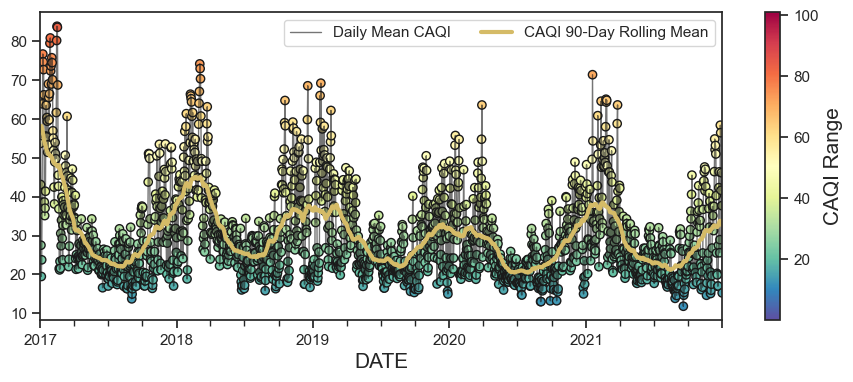

In [24]:
cmap = plt.get_cmap('Spectral_r')
vmin, vmax = df['CAQI_idx'].min(), df['CAQI_idx'].max()
norm = plt.Normalize(vmin=vmin, vmax=vmax)
colors = cmap(norm(mean_daily['CAQI_idx']))
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap))

ax = mean_daily['CAQI_idx'].plot(figsize=(11, 4), color='k', alpha=0.6, label="Daily Mean CAQI", lw=1);

ax.scatter(mean_daily.index, mean_daily['CAQI_idx'], c=colors, cmap=cmap, edgecolor='k');

#For the red outline
mean_daily['CAQI_idx'].rolling(90, center=True, min_periods=30).mean().\
    plot(ax=ax, c='y', lw=3, label="CAQI 90-Day Rolling Mean")

cbar.set_label('CAQI Range')

ax.legend(ncol=2, loc="upper right");

CAQI levels seemed to have been better during 2020. Similar to PM10 and PM2.5, CAQI levels seemed to be highest during 2017.

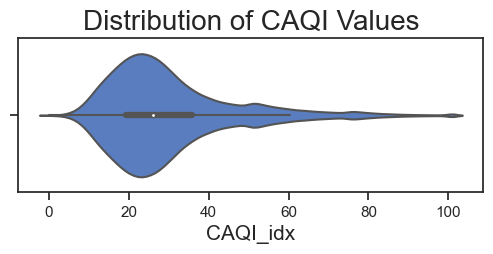

In [25]:
fig, ax = plt.subplots(figsize=(6, 2))

sns.violinplot(df['CAQI_idx'], ax=ax);

ax.set_title("Distribution of CAQI Values");

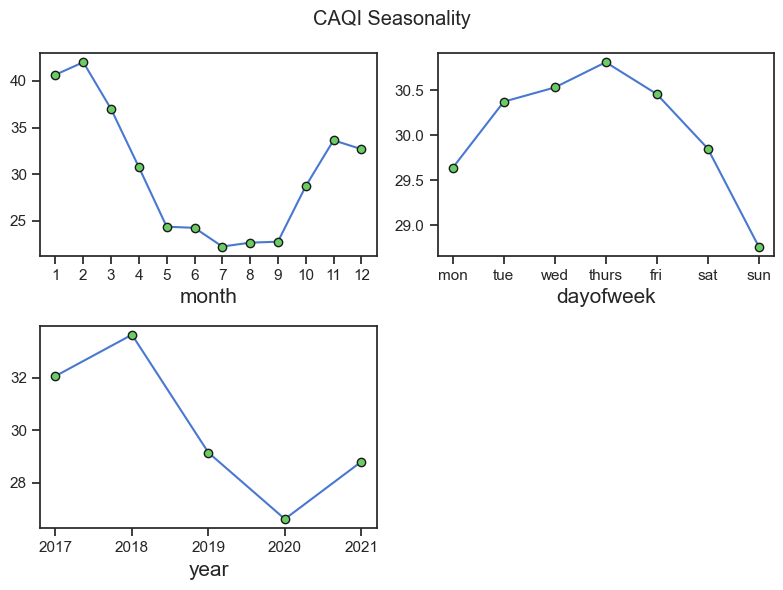

In [26]:
fig, axes = plt.subplots(2, 2, figsize=(8, 6), tight_layout=True)

for col, ax in zip(['month', 'dayofweek', 'year'], axes.flatten()):
    
    df.groupby(col)['CAQI_idx'].mean().plot(ax=ax, marker="o", mfc="g", mec="k")
    
    if col=='dayofweek':
        ax.set_xticks(np.arange(7), days)
    elif col=='month':
        ax.set_xticks(np.arange(1, 13, 1))
        
axes.flatten()[-1].set_axis_off()

plt.suptitle('CAQI Seasonality');

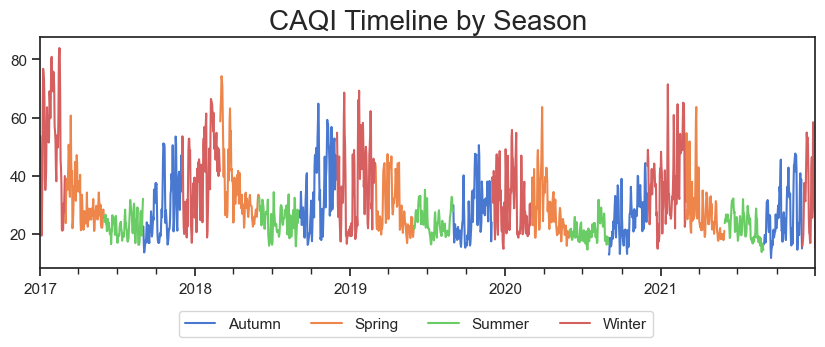

In [27]:
ax = df.groupby(['DATE', 'season'])['CAQI_idx'].mean().unstack("season").\
        plot(figsize=(10, 3));

ax.set_xlabel("")
ax.set_title("CAQI Timeline by Season")

ax.legend(ncol=4, bbox_to_anchor=(0.8, -0.15));

CAQI levels are lowest during summer and highest during winter. CAQI levels are lower during weekends.

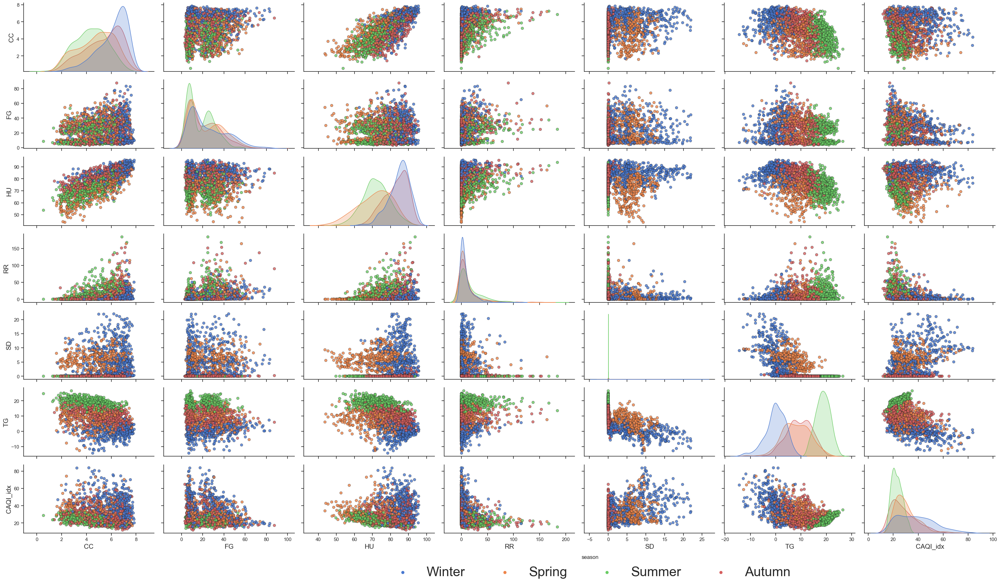

In [28]:
g = sns.pairplot(mean_daily[weather_cols + ['CAQI_idx', 'season']], hue = 'season',  
                 plot_kws={'alpha': 0.8, 'edgecolor' : 'k'});

g._legend.remove()
g.add_legend(ncol=4, bbox_to_anchor=(0.8,-0.02), fontsize=30);

plt.tight_layout();

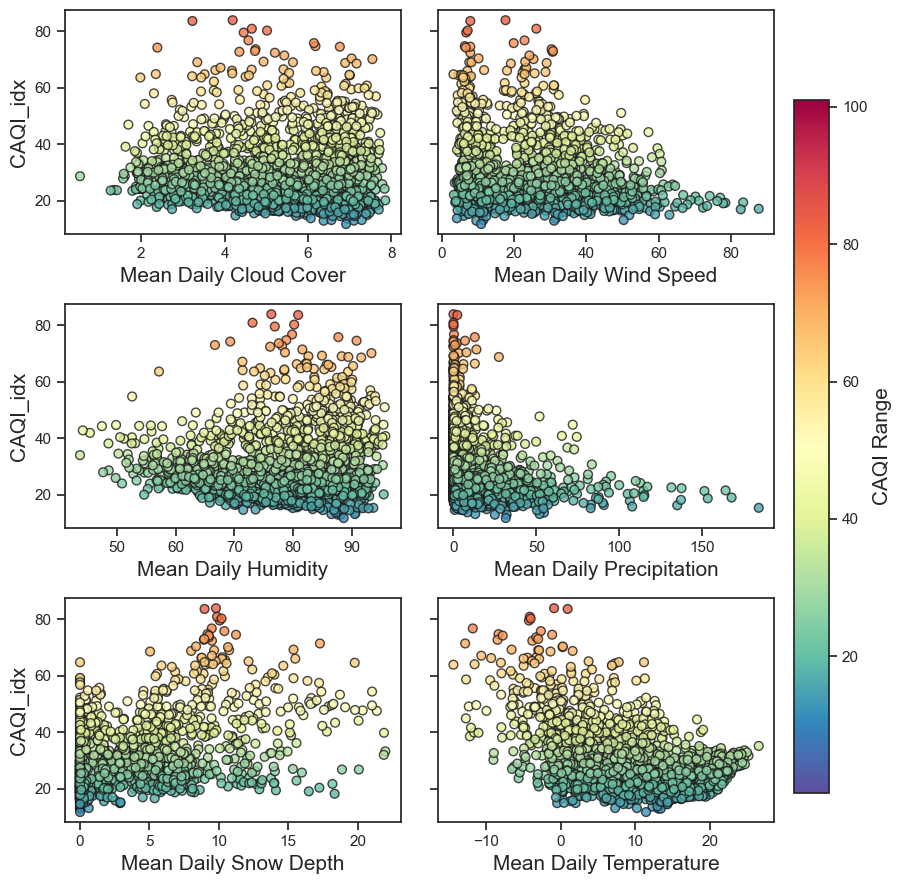

In [29]:
fig, axes = plt.subplots(3, 2, figsize=(8, 9), sharey=True, tight_layout=True)

for col, ax in zip(weather_cols, axes.flatten()):
    
    cax = mean_daily.plot(x=col, y='CAQI_idx', kind='scatter', edgecolor='k', ax=ax, alpha=0.8, s=40,
                          c=colors, cmap=cmap);
    
    cax.collections[0].colorbar.remove() # Remove colorbar
    
    ax.set_xlabel(f"Mean Daily {weather_dict[col]}");

# Add common color bar at the bottom
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=axes.ravel().tolist(), anchor=(3, 0.5))
cbar.set_label('CAQI Range')

Except for temeprature, there seems to be no apparant relation between CAQI and weather. For temeprature, as the temperature increases, the CAQI levels seems to be lower.

# Lags (In Progress)

### Lags of CAQI

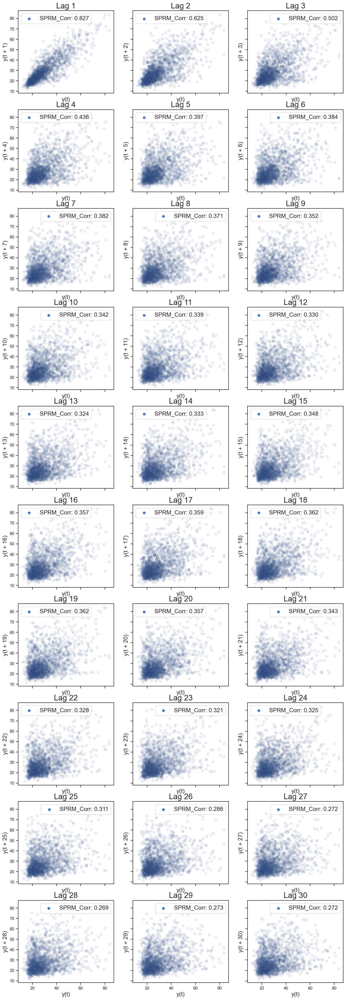

In [30]:
fig, axes = plt.subplots(10, 3, figsize=(15, 45), sharex=True, sharey=True)

for i, ax in zip(np.arange(1, 31, 1), axes.flatten()):
    
    temp_df = mean_daily.copy()
    
    temp_df[f"CAQI_lag{i}"] = temp_df["CAQI_idx"].shift(i)
    temp_df.dropna(inplace=True)
    
    cr = spearmanr(a=temp_df["CAQI_idx"], b=temp_df[f"CAQI_lag{i}"])[0]
    
    pd.plotting.lag_plot(mean_daily["CAQI_idx"], lag = i, edgecolor="k", alpha = 0.1, c="b", ax=ax)
    ax.scatter(y=[], x=[], label=f"SPRM_Corr: {cr:.3f}")
    
    ax.legend(fontsize=15)
    ax.set_title(f"Lag {i}")

The above plots shows the relation between CAQI values and its nth lag, n being between 1 and 30. CAQI values only has a strong correlation with its first lag. 


I will further decompose the daily mean CAQI to de-trend and de-seasonalize the variable. Will use Auto correlation and partial auto correlation plots to see how CAQI auto correlates with its own lags at different intervals of time.

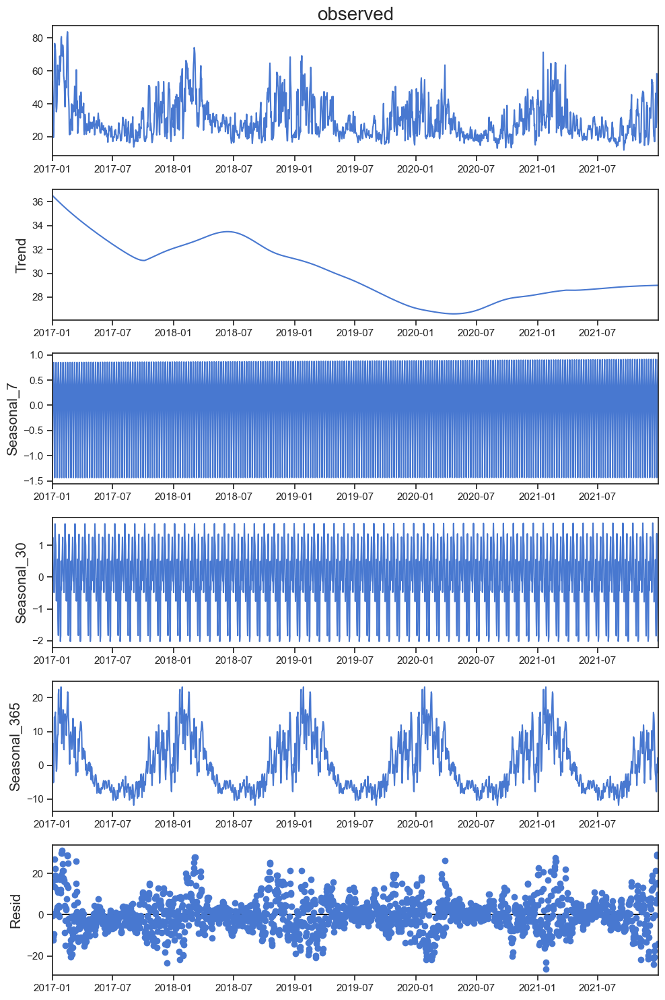

In [31]:
#Decomposing CAQI
mstl = MSTL(mean_daily["CAQI_idx"], 
            periods=(7, 30, 365), #Weekly, monthly, and yearly seasonality
            windows=[1001, 501, 101],
            stl_kwargs={
                "seasonal_deg":0, # Means the seasonal smoother is fit with a moving average.
               }
           )

res=mstl.fit()

fig = res.plot()
fig.set_size_inches((10, 15))
fig.tight_layout()

In [32]:
#Taking only the residuals
mean_daily['CAQI_resid'] = res.resid

One of the pre-requisites for doing ACF or PACF is ensuring the time series are stationary. In order to ensure all time series are stationary, Augmented Dickey-Fuller test will be used.

"The null hypothesis of the Augmented Dickey-Fuller is that there is a unit root, with the alternative that there is no unit root. If the pvalue is above a critical size, then we cannot reject that there is a unit root."

In [33]:
def ADFtest(series, alpha):
    
    result = adfuller(series, autolag='AIC')
    p_val = result[1]
    print(f'ADF Statistic: {result[0]}')
    print(f'n_lags: {result[1]}')
    print(f'p-value: {p_val:.10f}')
    print()
    
    for key, value in result[4].items():
        print('Critial Values:')
        print(f'   {key}, {value}')    
    
    print()
    if p_val < alpha:
        print(f"P-Value lower than alpha. Unit root does not exist. Hence Time series is Stationary")
    else:
        print(f"P-Value greater than alpha. Unit root does exist. Hence Time series is Not Stationary")

In [34]:
#check for stationarity for CAQI_resid
ADFtest(series=mean_daily['CAQI_resid'], alpha=0.01)

ADF Statistic: -15.861504530528936
n_lags: 9.200512726904179e-29
p-value: 0.0000000000

Critial Values:
   1%, -3.4339441475744668
Critial Values:
   5%, -2.8631276157416945
Critial Values:
   10%, -2.5676151930364455

P-Value lower than alpha. Unit root does not exist. Hence Time series is Stationary


The de-trended and de-seasonalized CAQI TS is stationary.

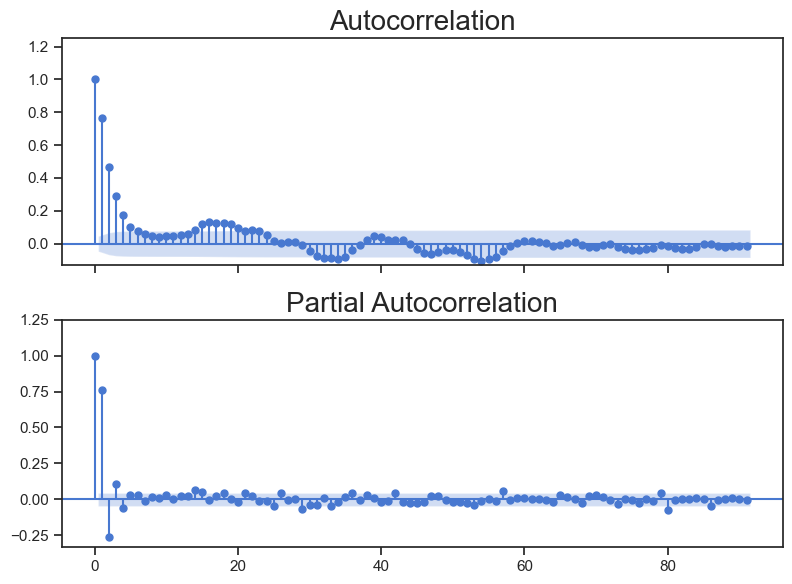

In [35]:
fig, ax = plt.subplots(2, 1, tight_layout=True, figsize=(8, 6), sharex=True)

plot_acf(x=mean_daily['CAQI_resid'], lags=91, auto_ylims=True, ax=ax[0])
plot_pacf(x=mean_daily['CAQI_resid'], lags=91, auto_ylims=True, ax=ax[1]);

Similar to the lag plots, the first lag has higher correlation compared to all other lags. Although Lag 2 shows some correlation, it is much weaker compared to first lag. Therefore, we will consider the first lag as a feature.

# Holidays

In [36]:
holiday_df = pd.read_csv("poland_holidays.csv", parse_dates=['date'])

In [37]:
holiday_df

,date,holiday_name,holiday_type
0,2017-01-01,New Year's Day,National holiday
1,2017-01-06,Epiphany,National holiday
2,2017-02-14,Valentine's Day,Observance
3,2017-03-20,March Equinox,Season
4,2017-04-14,Good Friday,Observance
...,...,...,...
127,2021-12-24,Christmas Eve,Observance
128,2021-12-25,Christmas Day,National holiday
129,2021-12-26,Second Day of Christmas,National holiday
130,2021-12-27,National Day of the Victorious Greater Poland ...,Observance


In [38]:
holiday_df['holiday_name'].unique()

array(["New Year's Day", 'Epiphany', "Valentine's Day", 'March Equinox',
       'Good Friday', 'Holy Saturday', 'Easter Sunday', 'Easter Monday',
       'Labor Day / May Day', 'Day of the Flag', 'Constitution Day',
       "Mother's Day", 'Children’s Day', 'Whit Sunday', 'Corpus Christi',
       'June Solstice', "Father's Day", 'Assumption of Mary',
       'September Equinox', "All Saints' Day", 'Independence Day',
       'December Solstice', 'Christmas Eve', 'Christmas Day',
       'Second Day of Christmas', "New Year's Eve",
       'Independence Day Holiday',
       'National Day of the Victorious Greater Poland Uprising'],
      dtype=object)

In [39]:
holiday_df['holiday_type'].unique()

array(['National holiday', 'Observance', 'Season'], dtype=object)

In [40]:
#Removing Season
holiday_df = holiday_df.query("holiday_type!='Season'").reset_index(drop=True)

In [41]:
mean_daily = mean_daily.join(holiday_df.set_index('date'), how='left')

In [42]:
mean_daily[['holiday_name', 'holiday_type']] = \
mean_daily[['holiday_name', 'holiday_type']].fillna("Non Holiday")

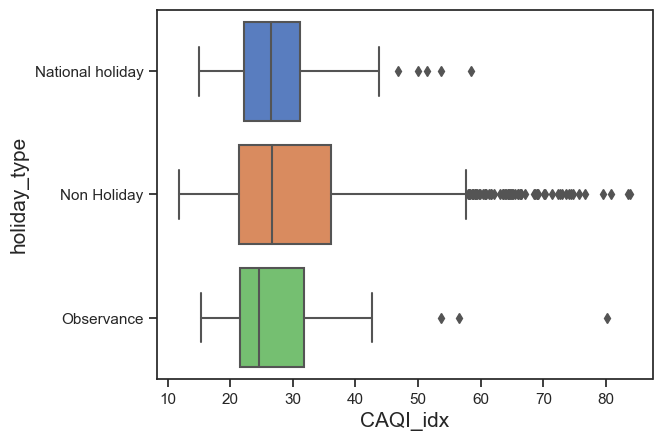

In [43]:
sns.boxplot(x='CAQI_idx', y="holiday_type", data=mean_daily, orient='h');

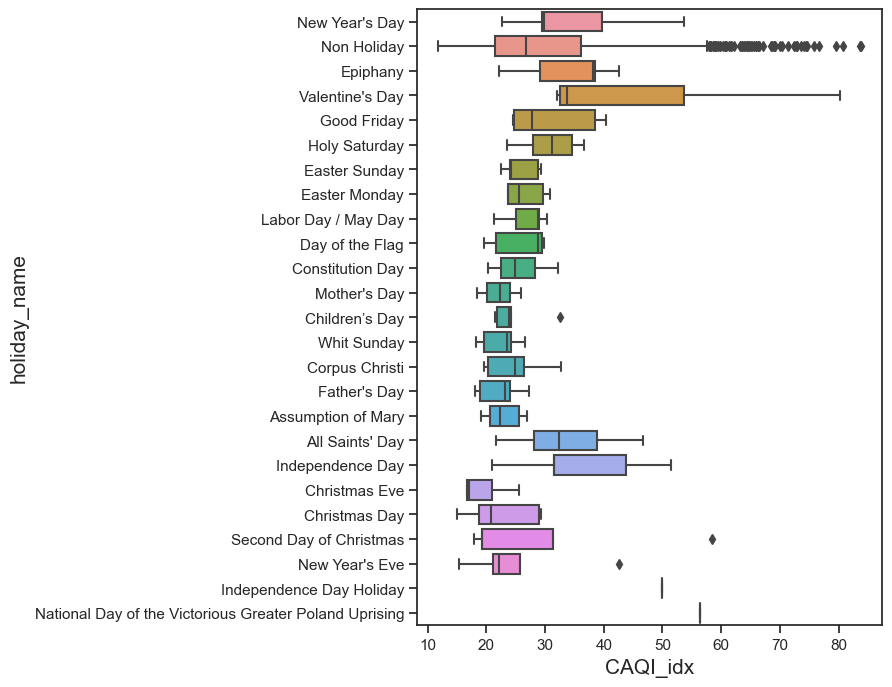

In [44]:
fig, ax = plt.subplots(figsize=(6, 8))

sns.boxplot(x='CAQI_idx', y="holiday_name", data=mean_daily, orient='h', ax=ax);

In [45]:
mean_daily = mean_daily.drop("holiday_type", axis=1)

In [46]:
df = df.merge(holiday_df[['date', 'holiday_name']], how='left', left_on='DATE', right_on='date').\
        drop('date', axis=1)

df['holiday_name'] = df['holiday_name'].fillna("Non Holiday")

# School Holidays

In [47]:
voivod_dict = {
    'Greater Poland':'wielkopolskie', 
    'Kuyavia-Pomerania':'kujawsko-pomorskie', 
    'Lesser Poland':'małopolskie',
    'Lower Silesia':'dolnośląskie', 
    'Lublin':'lubelskie', 
    'Lubusz':'lubuskie', 
    'Mazovia':'mazowieckie', 
    'Opole':'opolskie',
    'Podkarpackie':'podkarpackie', 
    'Podlaskie':'podlaskie', 
    'Pomerania':'pomorskie', 
    'Silesian':'śląskie',
    'Warmian-Masuria':'warmińsko-mazurskie', 
    'West Pomerania':'zachodniopomorskie', 
    'Łódź':'łódzkie', 
    'Świętokrzyskie':'świętokrzyskie'
}

In [48]:
def parse_school_vacation_data(year):
    temp = pd.read_html(f"https://www.holidays-info.com/poland/school-holidays/{year}")[0]
    temp = temp.rename(columns = {"Unnamed: 0" : "voivod"})
    
    for col in temp.columns[1:]:
        temp[col] = \
        temp[col].str.split(" - ").str[0] + f", {year}" + " - " + \
        temp[col].str.split(" - ").str[1] + f", {year}"

    return temp

In [49]:
school_hol_df = \
pd.concat(
    (parse_school_vacation_data(year=yr) for yr in tqdm(range(2017, 2022, 1))),
     ignore_index=True
)

school_hol_df

  0%|          | 0/5 [00:00<?, ?it/s]

,voivod,Winter,Spring,Summer,Christmas
0,Greater Poland,"Jan 30, 2017 - Feb 12, 2017","Apr 13, 2017 - Apr 18, 2017","Jun 30, 2017 - Aug 31, 2017","Dec 23, 2017 - Dec 31, 2017"
1,Kuyavia-Pomerania,"Jan 30, 2017 - Feb 12, 2017","Apr 13, 2017 - Apr 18, 2017","Jun 30, 2017 - Aug 31, 2017","Dec 23, 2017 - Dec 31, 2017"
2,Lesser Poland,"Jan 30, 2017 - Feb 12, 2017","Apr 13, 2017 - Apr 18, 2017","Jun 30, 2017 - Aug 31, 2017","Dec 23, 2017 - Dec 31, 2017"
3,Lower Silesia,"Feb 13, 2017 - Feb 26, 2017","Apr 13, 2017 - Apr 18, 2017","Jun 30, 2017 - Aug 31, 2017","Dec 23, 2017 - Dec 31, 2017"
4,Lublin,"Jan 16, 2017 - Jan 29, 2017","Apr 13, 2017 - Apr 18, 2017","Jun 30, 2017 - Aug 31, 2017","Dec 23, 2017 - Dec 31, 2017"
...,...,...,...,...,...
75,Silesian,"Feb 1, 2021 - Feb 14, 2021","Apr 1, 2021 - Apr 6, 2021","Jun 26, 2021 - Aug 31, 2021","Dec 23, 2021 - Dec 31, 2021"
76,Warmian-Masuria,"Jan 25, 2021 - Feb 7, 2021","Apr 1, 2021 - Apr 6, 2021","Jun 26, 2021 - Aug 31, 2021","Dec 23, 2021 - Dec 31, 2021"
77,West Pomerania,"Jan 18, 2021 - Jan 31, 2021","Apr 1, 2021 - Apr 6, 2021","Jun 26, 2021 - Aug 31, 2021","Dec 23, 2021 - Dec 31, 2021"
78,Łódź,"Feb 1, 2021 - Feb 14, 2021","Apr 1, 2021 - Apr 6, 2021","Jun 26, 2021 - Aug 31, 2021","Dec 23, 2021 - Dec 31, 2021"


In [50]:
#Adding school holiday indicator for each voivodship
for k, v in tqdm(voivod_dict.items()):
    for col in school_hol_df.columns[1:]:
        for date in school_hol_df.query(f"voivod=='{k}'")[col]:
            
            start = date.split(" - ")[0]
            end = date.split(" - ")[1]
            
            daterange = pd.date_range(start, end, freq='D')
            
            df.loc[df['voivodship'].eq(v) & df['DATE'].isin(daterange), "is_school_holiday"] = 1

  0%|          | 0/16 [00:00<?, ?it/s]

In [51]:
df['is_school_holiday'] = df['is_school_holiday'].fillna(0)

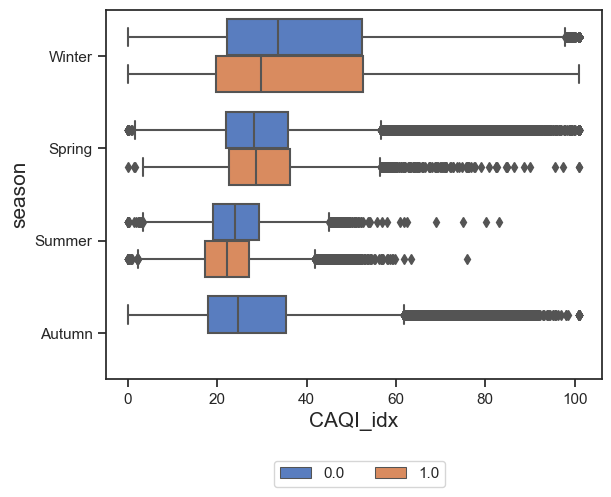

In [52]:
ax = sns.boxplot(x='CAQI_idx', y='season', data=df, orient='h', hue='is_school_holiday');

ax.legend(ncol=4, bbox_to_anchor=(0.7, -0.2));

# Effect of Covid lockdowns

In [53]:
lckdwn_1 = pd.date_range("2020-03-12", "2020-05-30", freq='D')
lckdwn_2 = pd.date_range("2020-10-24", "2021-02-01", freq='D')
lckdwn_3 = pd.date_range("2021-03-25", "2021-05-01", freq='D')

mean_daily.loc[
    mean_daily.index.isin(lckdwn_1) | mean_daily.index.isin(lckdwn_2) | mean_daily.index.isin(lckdwn_3),
    'is_lockdown'
] = 1

mean_daily['is_lockdown'] = mean_daily['is_lockdown'].fillna(0)

mean_daily.head()

,CC,FG,HU,RR,SD,TG,CAQI_idx,day,month,year,dayofweek,season,CAQI_resid,holiday_name,is_lockdown
DATE,,,,,,,,,,,,,,,
2017-01-01,4.969219,16.038114,84.417800,1.067211,1.506132,-0.509492,53.687390,1,1,2017,6,Winter,16.308065,New Year's Day,0.0
2017-01-02,6.149754,49.997367,84.802305,13.419765,1.460113,-1.203916,43.131935,2,1,2017,0,Winter,-0.648910,Non Holiday,0.0
2017-01-03,6.443146,18.794046,86.698963,16.233819,3.157176,-1.255800,27.514591,3,1,2017,1,Winter,-10.697037,Non Holiday,0.0
2017-01-04,7.203707,83.294089,88.100274,31.031889,5.905389,0.356110,19.468726,4,1,2017,2,Winter,-12.286746,Non Holiday,0.0
2017-01-05,5.814259,16.571876,82.413417,1.664624,8.467116,-5.646726,23.753453,5,1,2017,3,Winter,-9.270358,Non Holiday,0.0


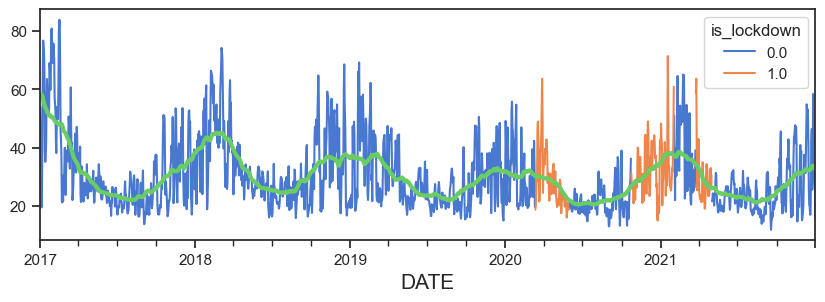

In [54]:
lockdown_df = \
mean_daily.groupby([mean_daily.index, "is_lockdown"])['CAQI_idx'].mean().unstack("is_lockdown")

lockdown_df["full"] = lockdown_df[[0.0, 1.0]].fillna(0).sum(axis=1)

ax = lockdown_df[[0.0, 1.0]].plot(figsize=(10, 3));

lockdown_df["full"].rolling(90, center=True, min_periods=30).mean().plot(ax=ax, lw=3);

In [55]:
df.loc[df['DATE'].isin(lckdwn_1) | df['DATE'].isin(lckdwn_2) | df['DATE'].isin(lckdwn_3),'is_lockdown'] = 1
df['is_lockdown'] = df['is_lockdown'].fillna(0)

# Static Cols

In [56]:
area_by_land = [col for col in df.columns if col.startswith("[area by land]")]

In [57]:
df.groupby('year')[area_by_land[1:]].mean()

,[area by land] utilised agricultural area,[area by land] forests,[area by land] residential areas,[area by land] industrial lands,[area by land] recreational and rest areas,[area by land] lands under waters,[area by land] wasteland,[area by land] other area
year,,,,,,,,
2017,2.509051,1.265794,0.052257,0.019614,0.010472,0.074780,0.050555,0.201154
2018,2.503739,1.272712,0.053528,0.019776,0.010713,0.074954,0.049931,0.198372
2019,2.501171,1.273823,0.055014,0.020285,0.010862,0.075490,0.049694,0.197966
2020,2.499234,1.274644,0.055795,0.021109,0.010862,0.075669,0.049521,0.198213
2021,2.495488,1.275264,0.058101,0.021349,0.010862,0.075669,0.049284,0.198489


In [58]:
# df.groupby(['powiat_voivod', 'voivodship', 'year'], as_index=False).mean().\
#     drop(['LAT', 'LON', 'NO2_24H_AVG_POLLUTION', 'O3_24H_AVG_POLLUTION', 'PM10_24H_AVG_POLLUTION',
#          'PM25_24H_AVG_POLLUTION', 'CC', 'FG', 'HU', 'RR', 'SD', 'TG', 'day', 'month', 'dayofweek',
#          'is_school_holiday', 'is_lockdown'], axis=1).to_csv("annual_voivod_static.csv", index=False)